In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [ ]:
# Set random seem for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [ ]:
# Root directory for dataset
#Current directory assumes the usage of paperspace cloud gpu
dataroot ="images"

In [ ]:
# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 128

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 400

# Learning rate for optimizers
lr_gen = 0.0002
lr_dis = 0.000035

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [ ]:
!unzip images.zip

Archive:  images.zip
   creating: images/
  inflating: __MACOSX/._images       
  inflating: images/.DS_Store        
  inflating: __MACOSX/images/._.DS_Store  
   creating: images/carmax/
  inflating: images/128_seluGAN_70-120.gif  
  inflating: __MACOSX/images/._128_seluGAN_70-120.gif  
  inflating: images/training_images.png  
  inflating: __MACOSX/images/._training_images.png  
   creating: images/carvana/
  inflating: images/128_seluGAN_120-170.gif  
  inflating: __MACOSX/images/._128_seluGAN_120-170.gif  
  inflating: images/generated_images.png  
  inflating: __MACOSX/images/._generated_images.png  
  inflating: images/128_seluGAN_0-70.gif  
  inflating: __MACOSX/images/._128_seluGAN_0-70.gif  
  inflating: images/carmax/63.jpg    
  inflating: images/carmax/823.jpg   
  inflating: images/carmax/2666.jpg  
  inflating: images/carmax/2100.jpg  
  inflating: images/carmax/1409.jpg  
  inflating: images/carmax/189.jpg   
  inflating: images/carmax/2114.jpg  
  inflating: images/car

In [ ]:
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

In [ ]:
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

In [ ]:
# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

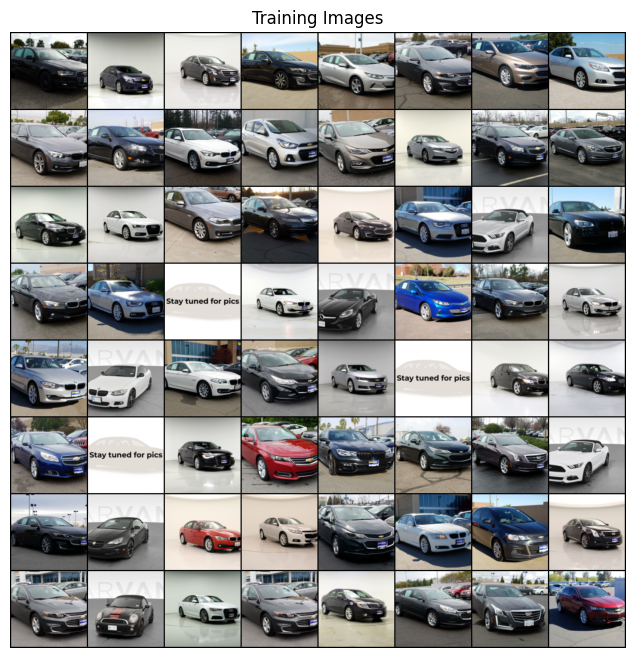

In [ ]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
print(device)

cuda:0


In [ ]:
# custom weights initialization called on netG and netD
# used when training a new DCGAN from scratch
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
# Generator Code
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(     nz, ngf * 16, 4, 1, 0, bias=False),
            nn.SELU(inplace=True),
            # state size. (ngf*16) x 4 x 4
            nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.SELU(inplace=True),
            # state size. (ngf*8) x 8 x 8
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.SELU(inplace=True),
            # state size. (ngf*4) x 16 x 16
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.SELU(inplace=True),
            # state size. (ngf*2) x 32 x 32
            nn.ConvTranspose2d(ngf * 2,     ngf, 4, 2, 1, bias=False),
            nn.SELU(inplace=True),
            # state size. (ngf) x 64 x 64
            nn.ConvTranspose2d(    ngf,      nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 128 x 128
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# uncomment the section below if you are training from scratch

# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 128 x 128
            nn.Conv2d(nc, ndf, 4, stride=2, padding=1, bias=False),
            nn.SELU(inplace=True),
            # state size. (ndf) x 64 x 64
            nn.Conv2d(ndf, ndf * 2, 4, stride=2, padding=1, bias=False),
            nn.SELU(inplace=True),
            # state size. (ndf*2) x 32 x 32
            nn.Conv2d(ndf * 2, ndf * 4, 4, stride=2, padding=1, bias=False),
            nn.SELU(inplace=True),
            # state size. (ndf*4) x 16 x 16
            nn.Conv2d(ndf * 4, ndf * 8, 4, stride=2, padding=1, bias=False),
            nn.SELU(inplace=True),
            # state size. (ndf*8) x 8 x 8
            nn.Conv2d(ndf * 8, ndf * 16, 4, stride=2, padding=1, bias=False),
            nn.SELU(inplace=True),
            # state size. (ndf*16) x 4 x 4
            nn.Conv2d(ndf * 16, 1, 4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
            # state size. 1
        )

    def forward(self, input):
        return self.main(input)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): SELU(inplace=True)
    (2): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): SELU(inplace=True)
    (4): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (5): SELU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): SELU(inplace=True)
    (8): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): SELU(inplace=True)
    (10): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (11): Tanh()
  )
)


In [ ]:
# uncomment the section below if you are training from scratch

# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)



# this section loads a pre-existing DCGAN generator, discriminator models
# as well as the optimizers
# comment out this entire section if you wish to train from scratch
netG = Generator(ngpu).to(device)
netD = Discriminator(ngpu).to(device)
optimizerD = optim.Adam(netD.parameters(), lr=lr_dis, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr_gen, betas=(0.5, 0.999))
#checkpoint = torch.load("/storage/128_CarGan_epoch120_selu.tar") #path of saved models
#netG.load_state_dict(checkpoint['netG_state_dict'])
#netD.load_state_dict(checkpoint['netD_state_dict'])
#optimizerD.load_state_dict(checkpoint['optimizerD_state_dict'])
#optimizerG.load_state_dict(checkpoint['optimizerG_state_dict'])

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): SELU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): SELU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (5): SELU(inplace=True)
    (6): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): SELU(inplace=True)
    (8): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): SELU(inplace=True)
    (10): Conv2d(1024, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (11): Sigmoid()
  )
)


In [ ]:
# Initialize BCELoss function
criterion = nn.BCELoss()

In [ ]:
# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

In [ ]:
# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

In [ ]:
# Setup Adam optimizers for both G and D
# comment out this section if you are training from pre-existing models
optimizerD = optim.Adam(netD.parameters(), lr=lr_dis, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr_gen, betas=(beta1, 0.999))

In [ ]:
# # Comment thia section if you want to train from scratch
# netG.train()
# netD.train()
# print(netG)
# print(netD)

Starting Training Loop...
epoch:  0
[0/400][0/27]	Loss_D: 0.9926	Loss_G: 0.9168	D(x): 0.6034	D(G(z)): 0.3461 / 0.4239


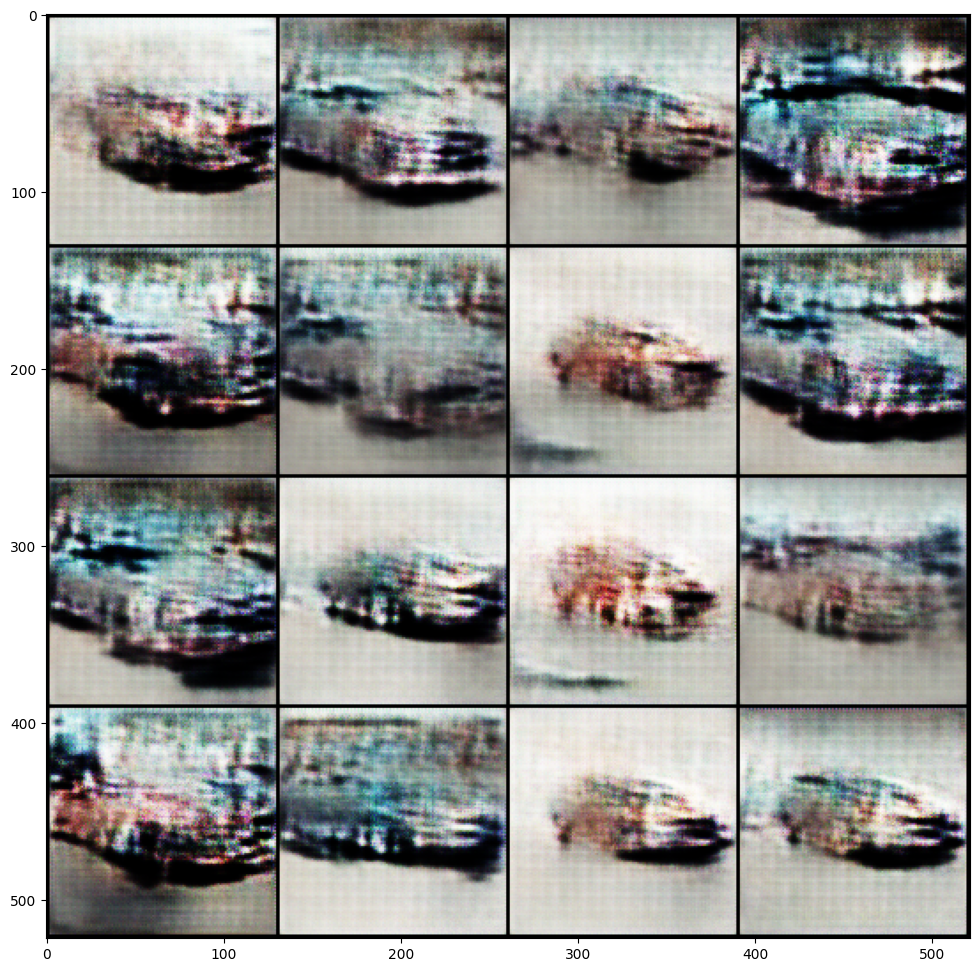

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fbe822535b0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1479, in __del__
    self._shutdown_workers()Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fbe822535b0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1479, in __del__

    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1462, in _shutdown_workers
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1462, in _shutdown_workers
    if w.is_alive():
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
        assert self._parent_pid == os.getpid(), 'can only te

epoch:  50
[50/400][0/27]	Loss_D: 1.1240	Loss_G: 1.0395	D(x): 0.5663	D(G(z)): 0.3525 / 0.3658


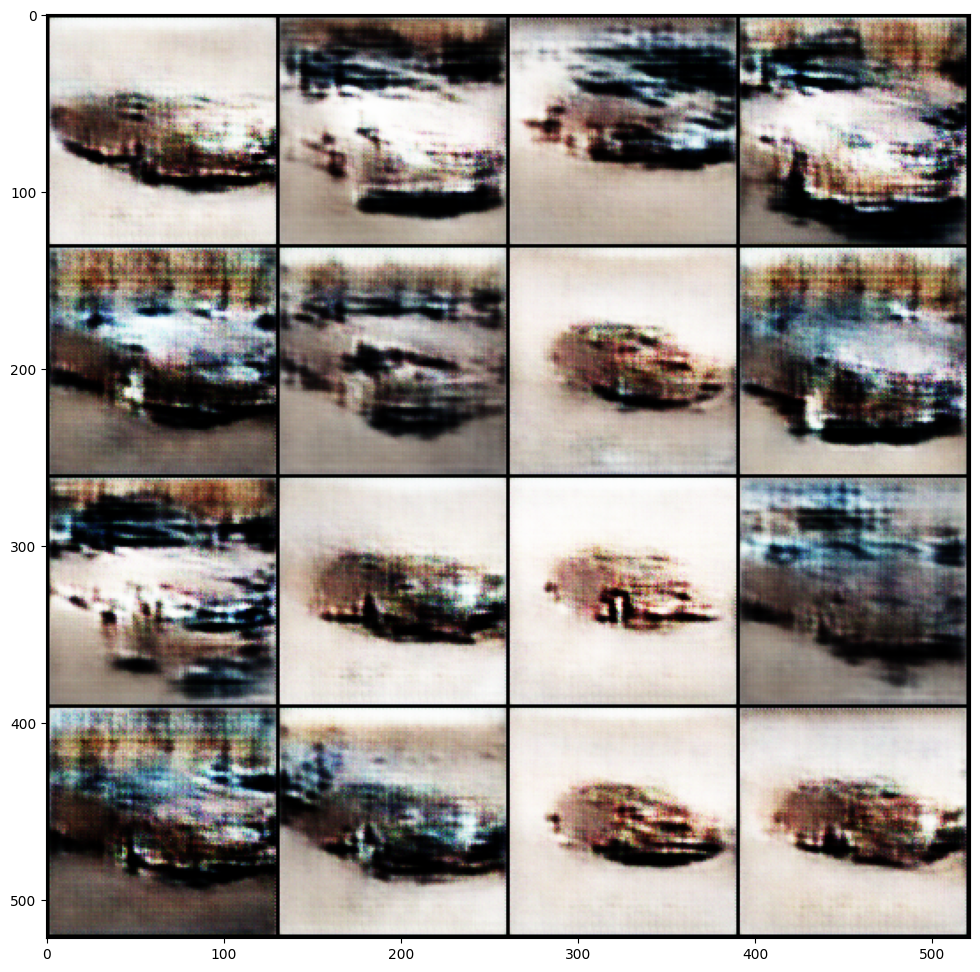

epoch:  100
[100/400][0/27]	Loss_D: 1.0799	Loss_G: 1.4112	D(x): 0.6333	D(G(z)): 0.4095 / 0.2651


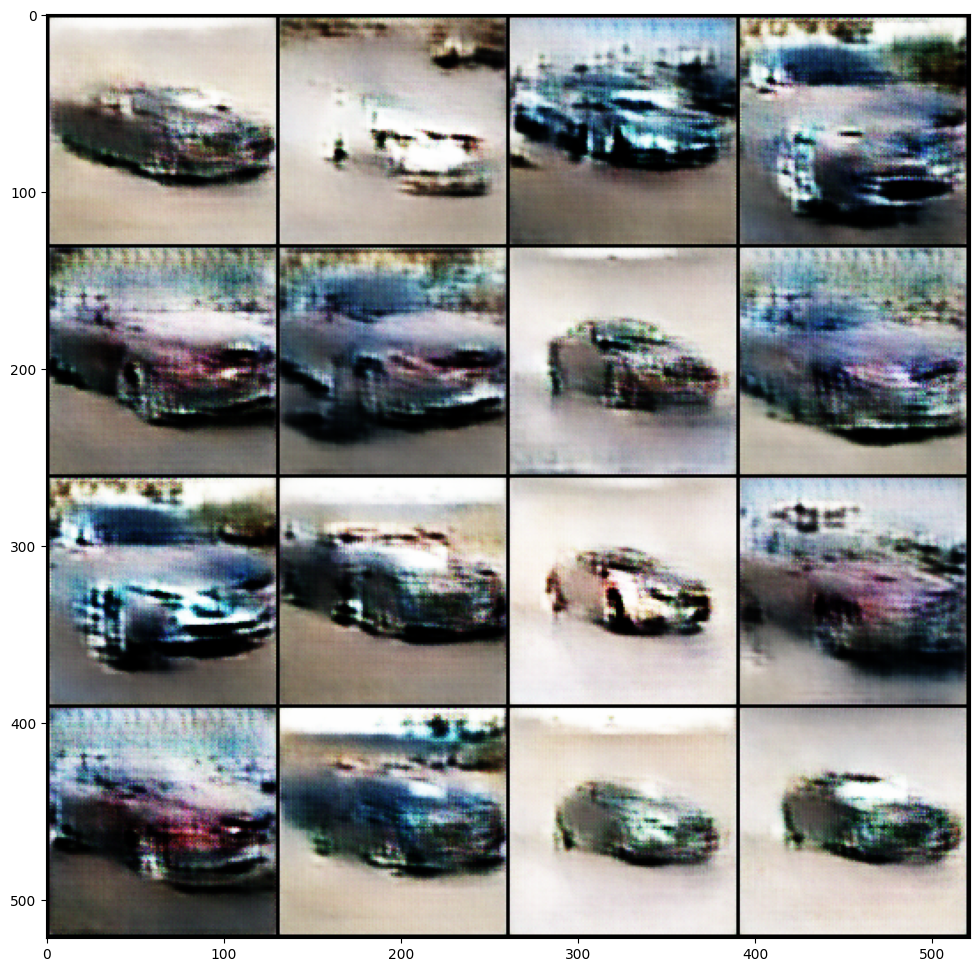

epoch:  150
[150/400][0/27]	Loss_D: 1.0946	Loss_G: 1.3124	D(x): 0.6728	D(G(z)): 0.4615 / 0.2932


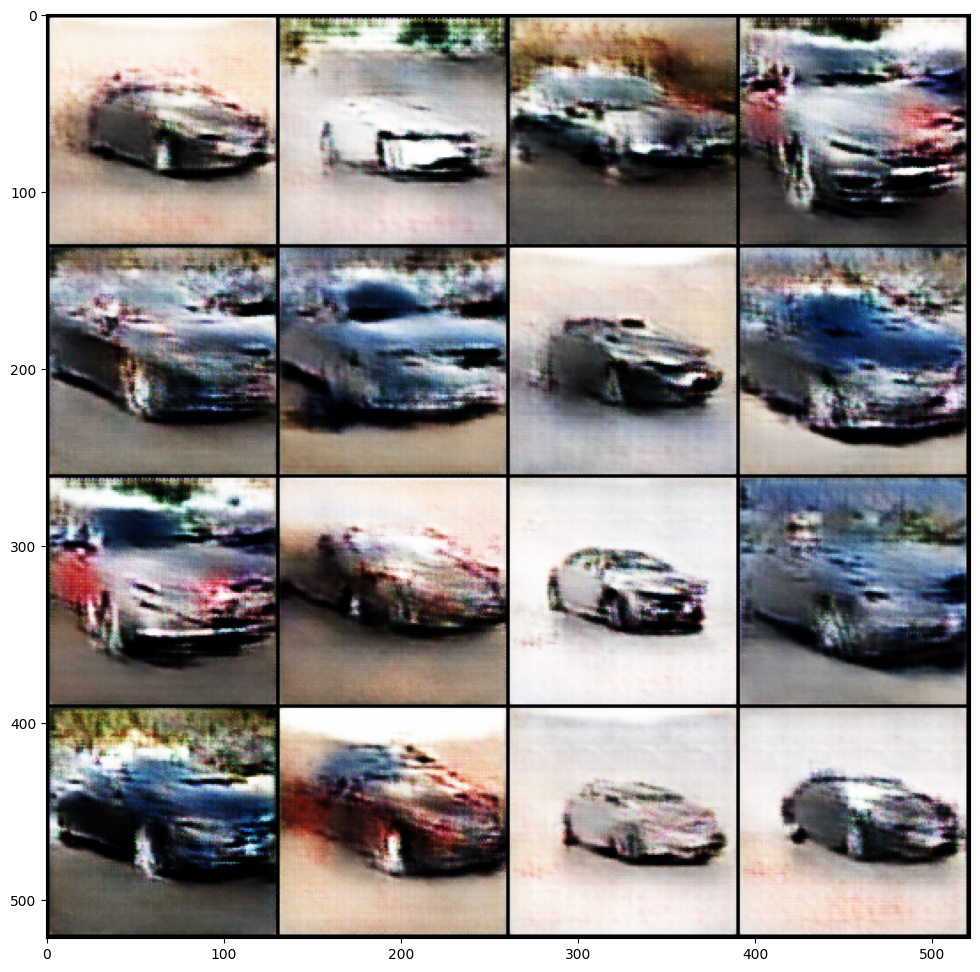

epoch:  200
[200/400][0/27]	Loss_D: 0.9980	Loss_G: 1.5325	D(x): 0.6814	D(G(z)): 0.4008 / 0.2453


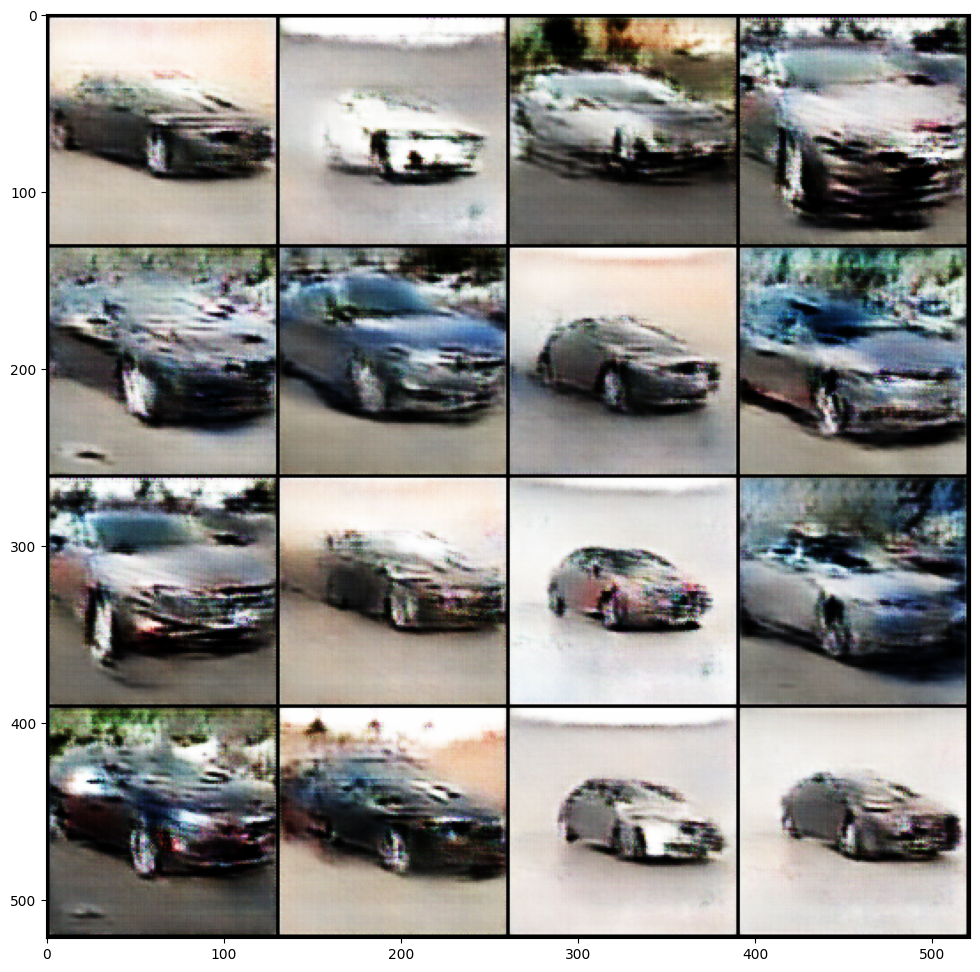

In [ ]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
ranVar = 0
for epoch in range(num_epochs):
    # For each batch in the dataloader
    if(epoch % 50 == 0):
      print("epoch: ", epoch)
    ranVar+=1
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label.float())
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label.float())
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label.float())
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if epoch % 50 == 0 and i % 27 == 0:
             print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                    % (epoch, num_epochs, i, len(dataloader),
                      errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake[0:16], padding = 2, normalize = True, nrow = 4))



        iters += 1


    # save models after every iteration
    fig = plt.figure(figsize = (12,12))
    ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=False)] for i in img_list]
    #plt.savefig("/artifacts/" + str(epoch) + ".png") #save image grid in file path
    if(epoch % 50 == 0):
      plt.show()
    plt.close()
    #torch.save({
    #    'netG_state_dict': netG.state_dict(),
    #    'netD_state_dict': netD.state_dict(),
    #    'optimizerG_state_dict': optimizerG.state_dict(),
    #    'optimizerD_state_dict': optimizerD.state_dict()
    #    }, '/artifacts/128_CarGan_epoch' + str(epoch) + '.tar') #save models and optimizers in file path